# Visualization - Filters
**Author**: Hyeri

In [35]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

## Path

In [36]:
model_fer = './models/model_ferplus_h.h5'
model_raf = './models/model_raf_h.h5'
input_model = model_raf

img_path = './data/RAF/images/test_0005_aligned.jpg'

### Load Model

In [37]:
model = load_model(input_model)

#print(model.summary())

### Choose An Image

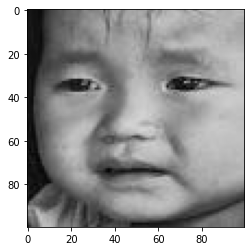

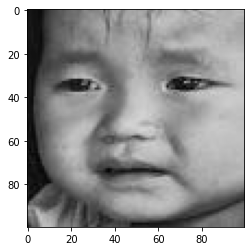

In [38]:
img_size = (100,100,3)

img = image.load_img(img_path, target_size = img_size[:2])
img_tensor = image.img_to_array(img)
img_tensor = img_tensor[np.newaxis, ...]
img_tensor /= 255.

#print(img_tensor.shape)
plt.imshow(img_tensor[0])

### Feature Maps

In [39]:
num_layers = 18
conv_output = [layer.output for layer in model.layers[:num_layers]]
activation_model = Model(inputs =[model.input], outputs = conv_output)
activations = activation_model.predict(img_tensor)

2022-01-24 01:33:16.091997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


2022-01-24 01:33:21.644436: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


/var/folders/m5/7hgrjyt92gl8lj0r862h_p2m0000gn/T/ipykernel_47613/2221005341.py:15: RuntimeWarning: invalid value encountered in true_divide
  channel_img /= channel_img.std()
/var/folders/m5/7hgrjyt92gl8lj0r862h_p2m0000gn/T/ipykernel_47613/2221005341.py:15: RuntimeWarning: divide by zero encountered in true_divide
  channel_img /= channel_img.std()


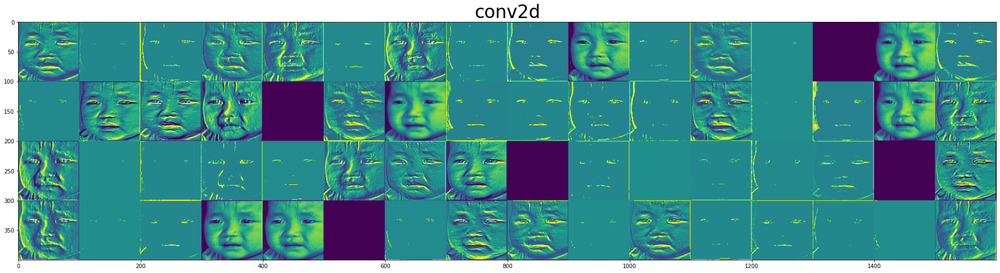

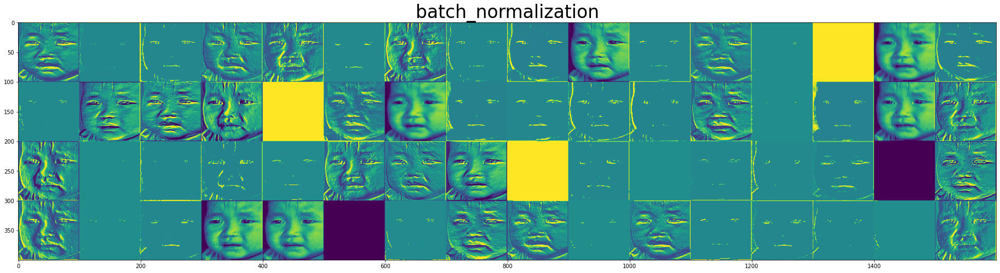

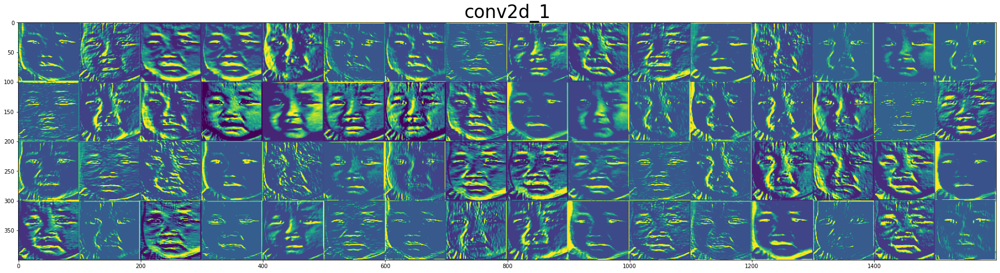

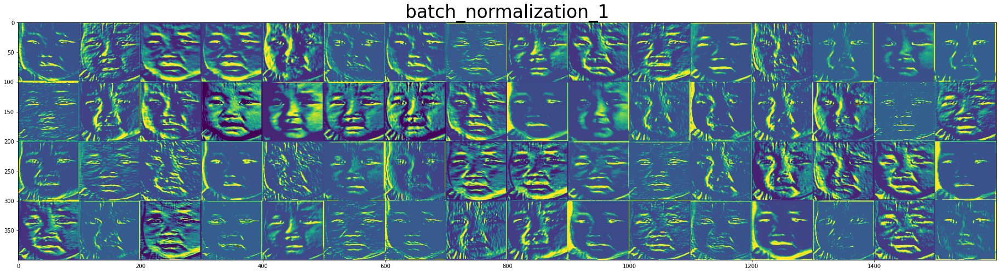

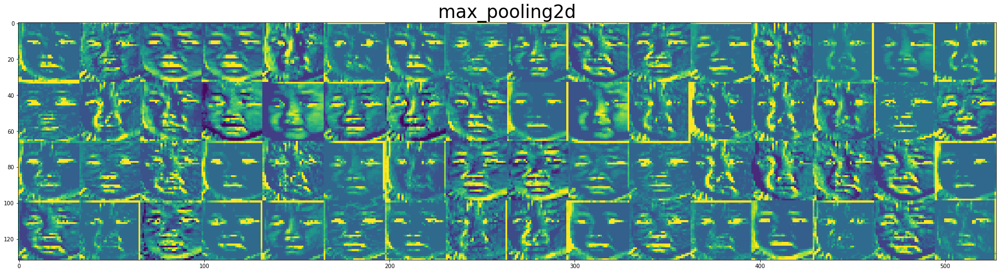

...

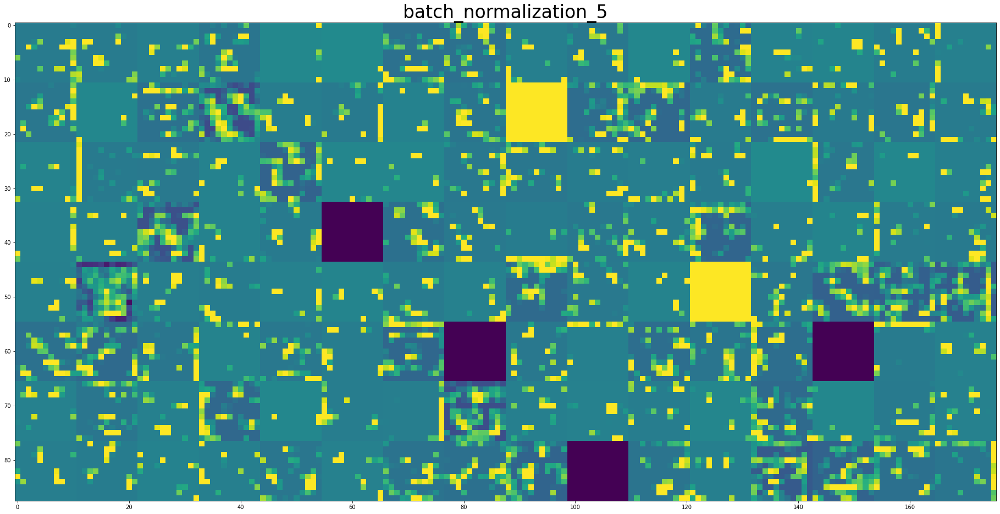

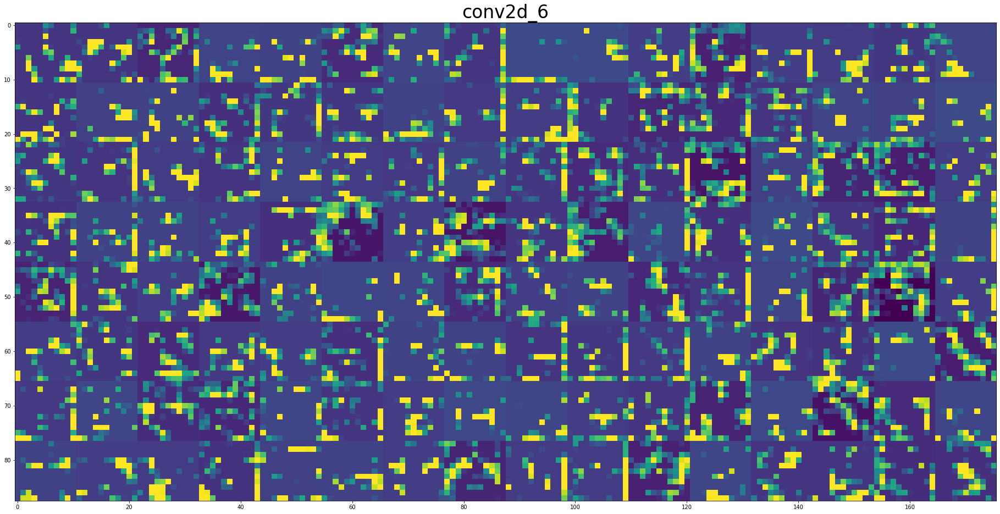

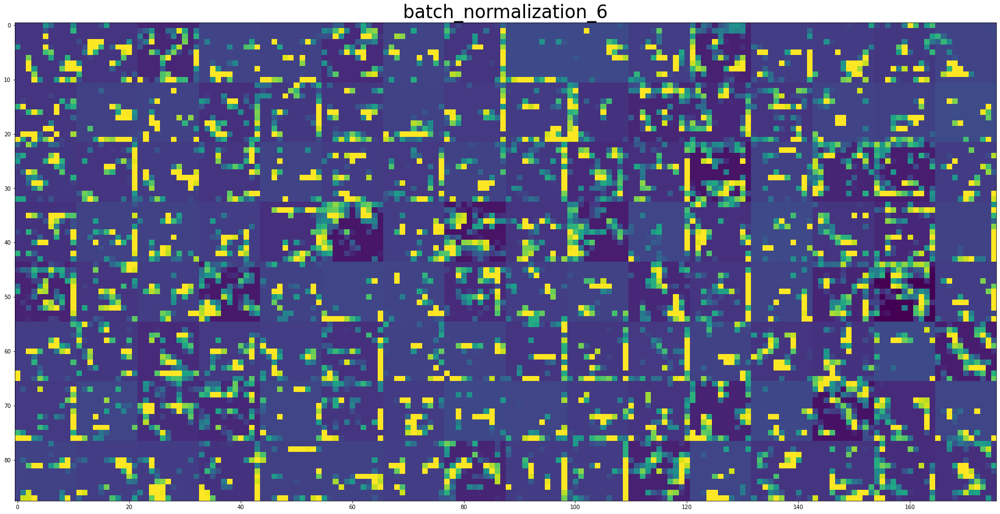

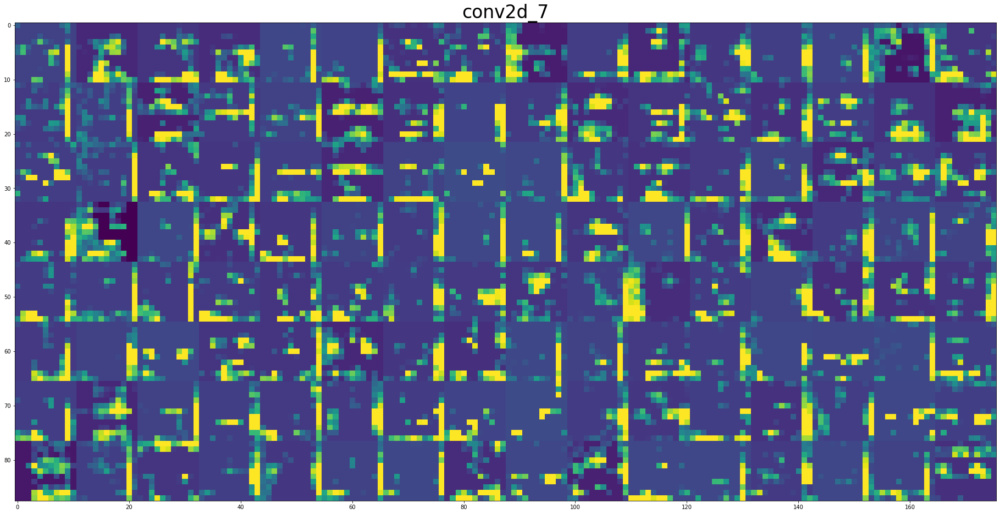

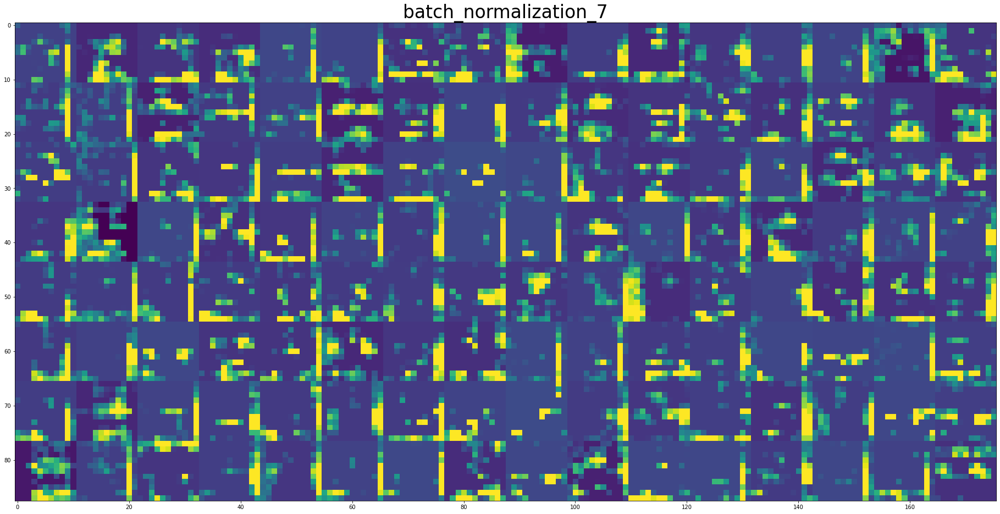

/var/folders/m5/7hgrjyt92gl8lj0r862h_p2m0000gn/T/ipykernel_47613/2221005341.py:15: RuntimeWarning: invalid value encountered in true_divide
  channel_img /= channel_img.std()
/var/folders/m5/7hgrjyt92gl8lj0r862h_p2m0000gn/T/ipykernel_47613/2221005341.py:15: RuntimeWarning: divide by zero encountered in true_divide
  channel_img /= channel_img.std()


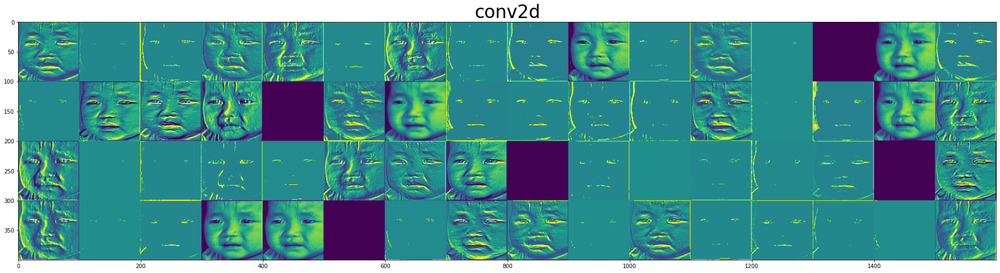

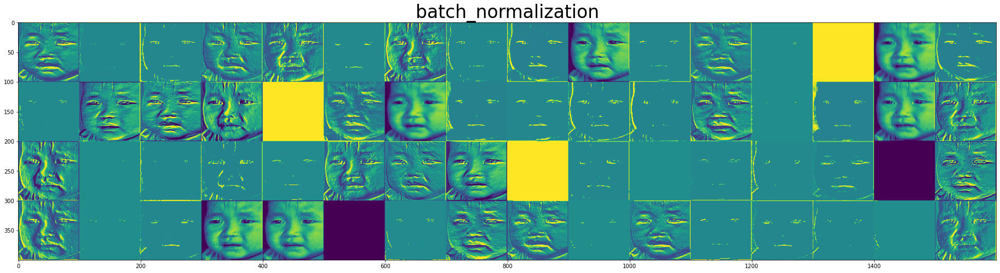

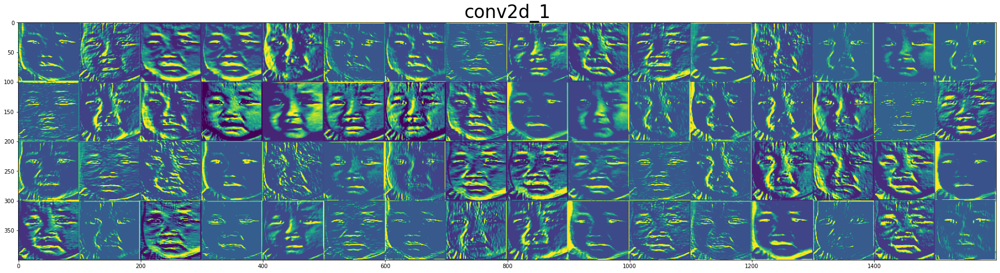

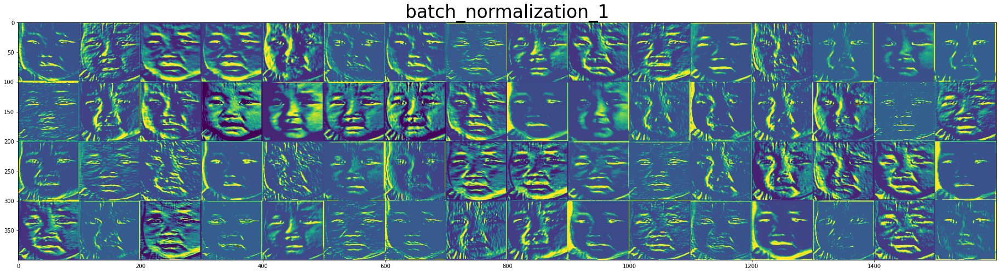

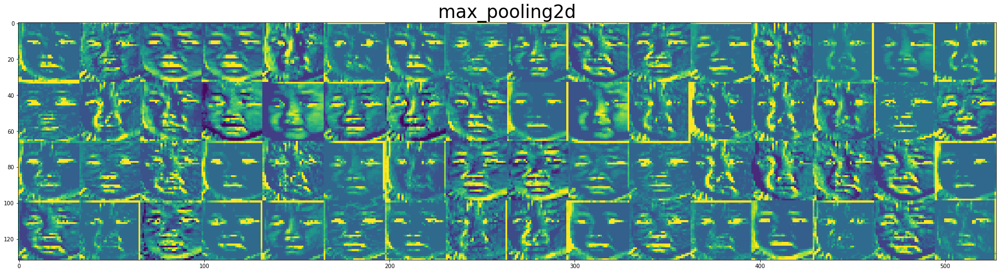

...

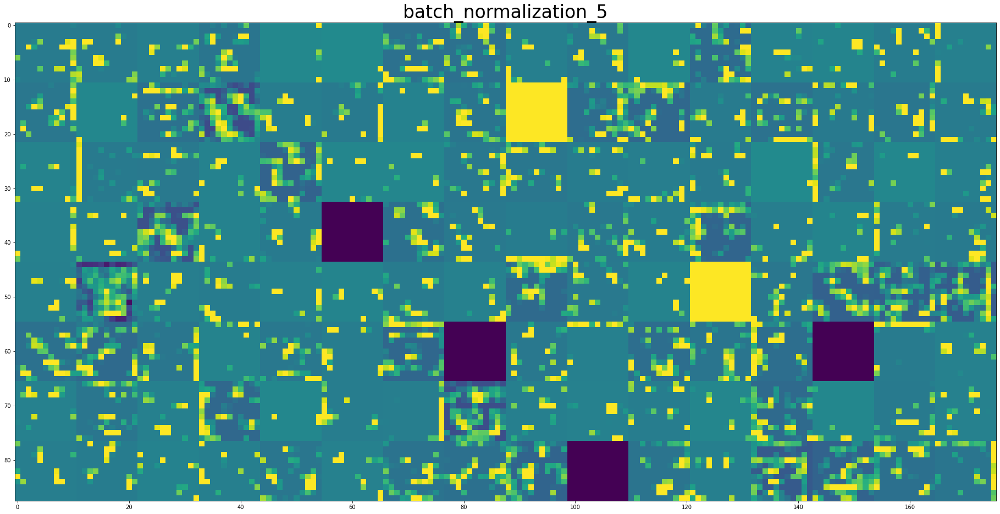

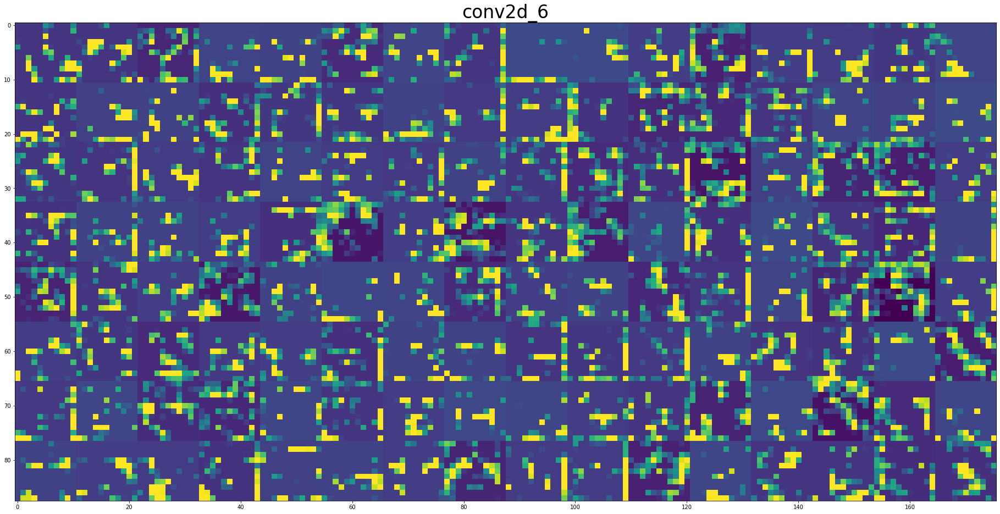

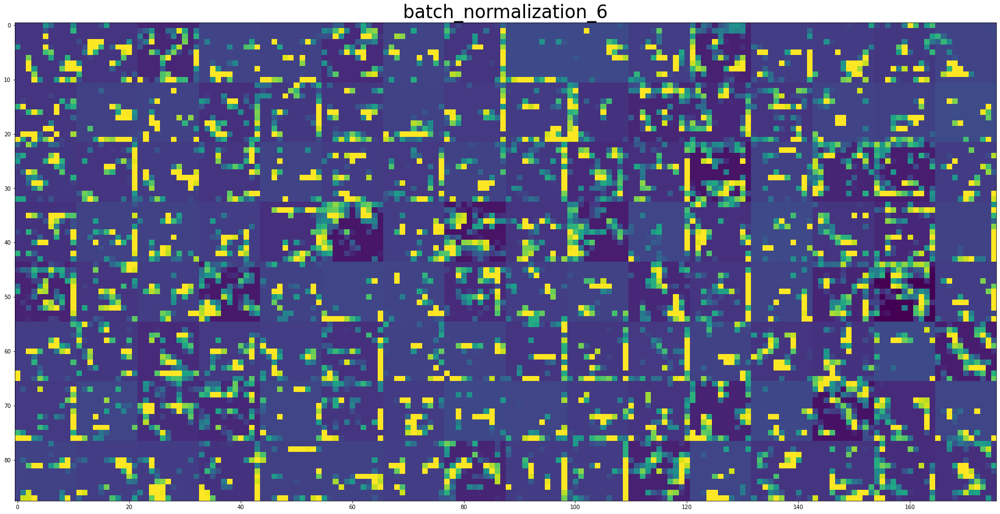

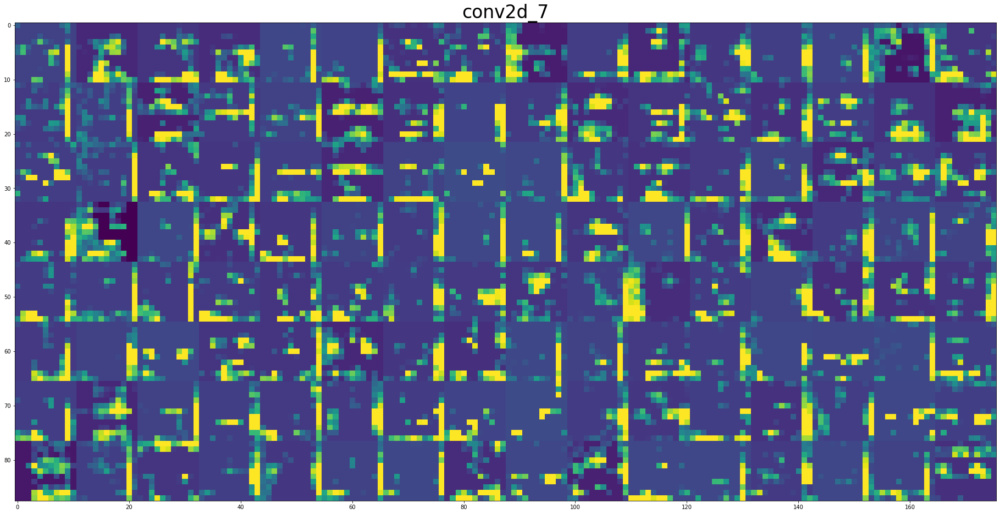

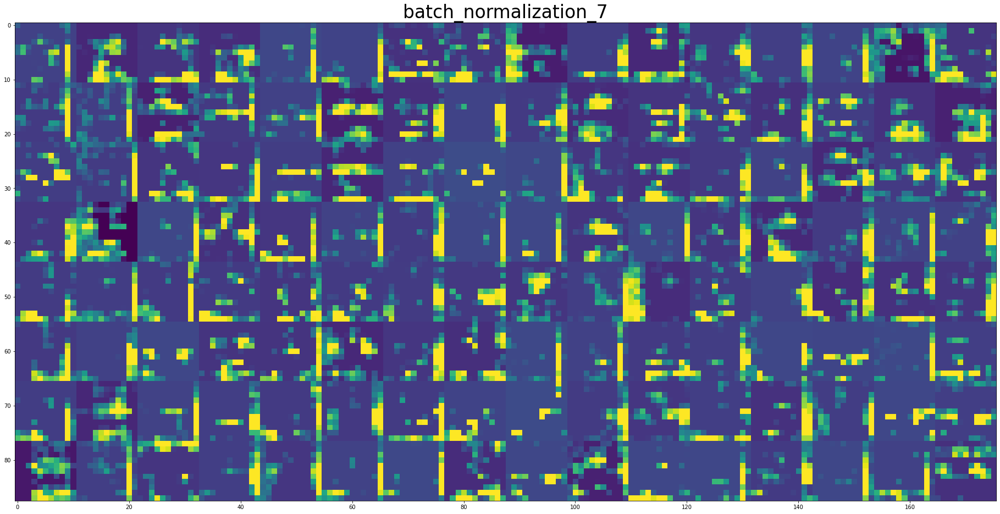

In [40]:
layer_names = [layer.name for layer in model.layers[:num_layers]]

for layer_name, layer_activation in zip(layer_names, activations):
    img_per_row = 16
    num_features = layer_activation.shape[-1]
    img_per_row = min(img_per_row, num_features)
    size = layer_activation.shape[1]
    num_cols = num_features // img_per_row
    display_grid = np.zeros((size*num_cols, img_per_row*size))

    for col in range(num_cols):
        for row in range(img_per_row):
            channel_img = layer_activation[0, :, :, col * img_per_row + row]
            channel_img -= channel_img.mean()
            channel_img /= channel_img.std()
            channel_img *= 64
            channel_img += 128
            channel_img = np.clip(channel_img, 0, 255).astype('uint8')
            display_grid[col*size : (col+1) *size, row*size : (row+1)*size] = channel_img

    scale = 2./size
    plt.figure(figsize=(scale*display_grid.shape[1],
                        scale*display_grid.shape[0]))
    plt.title(layer_name, size=33)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
